<a href="https://colab.research.google.com/github/positivezenart/Donor-choose-dataset-modeling-with-supervised-algorithms/blob/main/final__of_Assignment_DT_Instructions.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# <b>Assignment : DT</b>

<font color='red'><b> Please check below video before attempting this assignment</b></font>

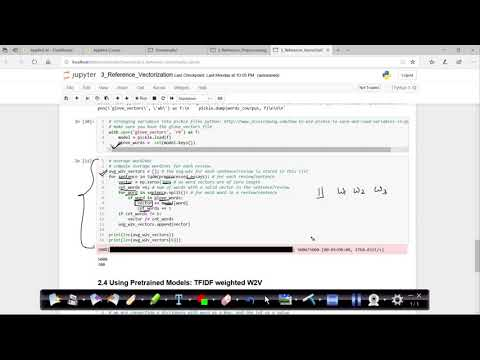

In [ ]:
from IPython.display import YouTubeVideo
YouTubeVideo('ZhLXULFjIjQ', width="1000",height="500")

<font color='red'><b> TF-IDFW2V</b></font>

<b>Tfidf w2v (w1,w2..) = (tfidf(w1) * w2v(w1) + tfidf(w2) * w2v(w2) + …)  /    (tfidf(w1) + tfidf(w2) + …)</b>

<b>(Optional) Please check course video on [AVgw2V and TF-IDFW2V ](https://www.appliedaicourse.com/lecture/11/applied-machine-learning-online-course/2916/avg-word2vec-tf-idf-weighted-word2vec/3/module-3-foundations-of-natural-language-processing-and-machine-learning)for more details.

<font color='blue'><b>Glove vectors </b></font>

<b>In this assignment you will be working with glove vectors , please check  [this](https://en.wikipedia.org/wiki/GloVe_(machine_learning)) and [this](https://en.wikipedia.org/wiki/GloVe_(machine_learning)) for more details.</b><br>

Download glove vectors from this [link ](https://drive.google.com/file/d/1lDca_ge-GYO0iQ6_XDLWePQFMdAA2b8f/view?usp=sharing)

In [ ]:
#please use below code to load glove vectors 
with open('/content/drive/My Drive/preprocessed_data/glove_vectors', 'rb') as f:
    model = pickle.load(f)
    glove_words =  set(model.keys())

FileNotFoundError: ignored

or else , you can use below code

In [ ]:
'''
# Reading glove vectors in python: https://stackoverflow.com/a/38230349/4084039
def loadGloveModel(gloveFile):
    print ("Loading Glove Model")
    f = open(gloveFile,'r', encoding="utf8")
    model = {}
    for line in tqdm(f):
        splitLine = line.split()
        word = splitLine[0]
        embedding = np.array([float(val) for val in splitLine[1:]])
        model[word] = embedding
    print ("Done.",len(model)," words loaded!")
    return model
model = loadGloveModel('glove.42B.300d.txt')

# ============================
Output:
    
Loading Glove Model
1917495it [06:32, 4879.69it/s]
Done. 1917495  words loaded!

# ============================

words = []
for i in preproced_texts:
    words.extend(i.split(' '))

for i in preproced_titles:
    words.extend(i.split(' '))
print("all the words in the coupus", len(words))
words = set(words)
print("the unique words in the coupus", len(words))

inter_words = set(model.keys()).intersection(words)
print("The number of words that are present in both glove vectors and our coupus", \
      len(inter_words),"(",np.round(len(inter_words)/len(words)*100,3),"%)")

words_courpus = {}
words_glove = set(model.keys())
for i in words:
    if i in words_glove:
        words_courpus[i] = model[i]
print("word 2 vec length", len(words_courpus))


# stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/

import pickle
with open('glove_vectors', 'wb') as f:
    pickle.dump(words_courpus, f)


'''

'\n# Reading glove vectors in python: https://stackoverflow.com/a/38230349/4084039\ndef loadGloveModel(gloveFile):\n    print ("Loading Glove Model")\n    f = open(gloveFile,\'r\', encoding="utf8")\n    model = {}\n    for line in tqdm(f):\n        splitLine = line.split()\n        word = splitLine[0]\n        embedding = np.array([float(val) for val in splitLine[1:]])\n        model[word] = embedding\n    print ("Done.",len(model)," words loaded!")\n    return model\nmodel = loadGloveModel(\'glove.42B.300d.txt\')\n\n# ============================\nOutput:\n    \nLoading Glove Model\n1917495it [06:32, 4879.69it/s]\nDone. 1917495  words loaded!\n\n# ============================\n\nwords = []\nfor i in preproced_texts:\n    words.extend(i.split(\' \'))\n\nfor i in preproced_titles:\n    words.extend(i.split(\' \'))\nprint("all the words in the coupus", len(words))\nwords = set(words)\nprint("the unique words in the coupus", len(words))\n\ninter_words = set(model.keys()).intersection(word

# <font color='red'> <b>Task - 1</b></font>

<ol>
    <li><strong>Apply Decision Tree Classifier(DecisionTreeClassifier) on these feature sets</strong>
        <ul>
            <li><font color='red'>Set 1</font>: categorical, numerical features +  preprocessed_essay (TFIDF) + Sentiment scores(preprocessed_essay)</li>
            <li><font color='red'>Set 2</font>: categorical, numerical features +  preprocessed_essay (TFIDF W2V) + Sentiment scores(preprocessed_essay)</li>        </ul>
    </li>
    <li><strong>The hyper paramter tuning (best `depth` in range [1, 3, 10, 30], and the best `min_samples_split` in range [5, 10, 100, 500])</strong>
        <ul>
    <li>Find the best hyper parameter which will give the maximum <a href='https://www.appliedaicourse.com/course/applied-ai-course-online/lessons/receiver-operating-characteristic-curve-roc-curve-and-auc-1/'>AUC</a> value</li>
    <li>find the best hyper paramter using k-fold cross validation(use gridsearch cv or randomsearch cv)/simple cross validation data(you can write your own for loops refer sample solution)</li>
        </ul>
    </li>
    <li>
    <strong>Representation of results</strong>
        <ul>
    <li>You need to plot the performance of model both on train data and cross validation data for each hyper parameter, like shown in the figure
    <img src='https://i.imgur.com/Gp2DQmh.jpg' width=500px> with X-axis as <strong>min_sample_split</strong>, Y-axis as <strong>max_depth</strong>, and Z-axis as <strong>AUC Score</strong> , we have given the notebook which explains how to plot this 3d plot, you can find it in the same drive <i>3d_scatter_plot.ipynb</i></li>
            <p style="text-align:center;font-size:30px;color:red;"><strong>or</strong></p> <br>
    <li>You need to plot the performance of model both on train data and cross validation data for each hyper parameter, like shown in the figure
    <img src='https://i.imgur.com/fgN9aUP.jpg' width=300px> <a href='https://seaborn.pydata.org/generated/seaborn.heatmap.html'>seaborn heat maps</a> with rows as <strong>min_sample_split</strong>, columns as <strong>max_depth</strong>, and values inside the cell representing <strong>AUC Score</strong> </li>
    <li>You choose either of the plotting techniques out of 3d plot or heat map</li>
    <li>Once after you found the best hyper parameter, you need to train your model with it, and find the AUC on test data and plot the ROC curve on both train and test.
        Make sure that you are using predict_proba method to calculate AUC curves, because AUC is calcualted on class probabilities and not on class labels.
    <img src='https://i.imgur.com/wMQDTFe.jpg' width=300px></li>
    <li>Along with plotting ROC curve, you need to print the <a href='https://www.appliedaicourse.com/course/applied-ai-course-online/lessons/confusion-matrix-tpr-fpr-fnr-tnr-1/'>confusion matrix</a> with predicted and original labels of test data points
    <img src='https://i.imgur.com/IdN5Ctv.png' width=300px></li>
    <li>Once after you plot the confusion matrix with the test data, get all the `false positive data points`
        <ul>
            <li> Plot the WordCloud(https://www.geeksforgeeks.org/generating-word-cloud-python/) with the words of essay text of these `false positive data points`</li>
            <li> Plot the box plot with the `price` of these `false positive data points`</li>
            <li> Plot the pdf with the `teacher_number_of_previously_posted_projects` of these `false positive data points`</li>
        </ul>
        </ul>
    </li>
   

# <font color='red'><b> Task - 2 </b></font>

For this task consider **set-1** features.

*  Select all the features which are having non-zero feature importance.You can get the feature importance using  'feature_importances_` 
   (https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html), discard the all other remaining features and then apply any of the model of you choice i.e. (Dession tree, Logistic Regression, Linear SVM).
*  You need to do hyperparameter tuning corresponding to the model you selected and procedure in step 2 and step 3<br>
  **Note**: when you want to find the feature importance make sure you don't use max_depth parameter keep it None.
  </li>
    <br>
You need to summarize the results at the end of the notebook, summarize it in the table format
        <img src='http://i.imgur.com/YVpIGGE.jpg' width=400px>
    </li>
</ol>

<font color='blue'><b>Hint for calculating Sentiment scores</b></font>

In [ ]:
pip install vaderSentiment

     |████████████████████████████████| 125 kB 8.4 MB/s 


In [ ]:
pip install chart-studio

     |████████████████████████████████| 64 kB 2.3 MB/s 
  Created wheel for retrying: filename=retrying-1.3.3-py3-none-any.whl size=11447 sha256=a33a36046afe5103d449024e79104684eab2f87ea06dff0e862edd002dbb4410
  Stored in directory: /root/.cache/pip/wheels/f9/8d/8d/f6af3f7f9eea3553bc2fe6d53e4b287dad18b06a861ac56ddf
Successfully built retrying


In [ ]:
import nltk
nltk.download('vader_lexicon')

[nltk_data] Downloading package vader_lexicon to /root/nltk_data...


True

In [ ]:
import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer
# import nltk
# nltk.download('vader_lexicon')

sid = SentimentIntensityAnalyzer()

sample_sentence_1='I am happy.'
ss_1 = sid.polarity_scores(sample_sentence_1)
print('sentiment score for sentence 1',ss_1)

sample_sentence_2='I am sad.'
ss_2 = sid.polarity_scores(sample_sentence_2)
print('sentiment score for sentence 2',ss_2)

sample_sentence_3='I am going to New Delhi tommorow.'
ss_3 = sid.polarity_scores(sample_sentence_3)
print('sentiment score for sentence 3',ss_3)


sentiment score for sentence 1 {'neg': 0.0, 'neu': 0.213, 'pos': 0.787, 'compound': 0.5719}
sentiment score for sentence 2 {'neg': 0.756, 'neu': 0.244, 'pos': 0.0, 'compound': -0.4767}
sentiment score for sentence 3 {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}


/usr/local/lib/python3.7/dist-packages/nltk/twitter/__init__.py:20: UserWarning: The twython library has not been installed. Some functionality from the twitter package will not be available.
  warnings.warn("The twython library has not been installed. "


<h1> Decision Tree </h1>

# <font color='red'> <b>Task - 1</b></font>

## 1.1 Loading Data

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

import pandas as pd
import numpy as np
import nltk
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import roc_curve, auc

import re
# Tutorial about Python regular expressions: https://pymotw.com/2/re/

import pickle
from tqdm import tqdm
import os

from chart_studio import plotly
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()
from collections import Counter

In [ ]:
#make sure you are loading atleast 50k datapoints
#you can work with features of preprocessed_data.csv for the assignment.

data = pd.read_csv('/content/drive/My Drive/preprocessed_data.csv',nrows = 50000)
data.head(1)

,school_state,teacher_prefix,project_grade_category,teacher_number_of_previously_posted_projects,project_is_approved,clean_categories,clean_subcategories,essay,price
0,ca,mrs,grades_prek_2,53,1,math_science,appliedsciences health_lifescience,i fortunate enough use fairy tale stem kits cl...,725.05


In [ ]:
#Displaying the columns names
data.columns

Index(['school_state', 'teacher_prefix', 'project_grade_category',
       'teacher_number_of_previously_posted_projects', 'project_is_approved',
       'clean_categories', 'clean_subcategories', 'essay', 'price'],
      dtype='object')

            <b>calculate sentiment scores for the essay feature</b>

In [ ]:
#calculate sentiment scores for the essay feature 
#https://www.geeksforgeeks.org/python-sentiment-analysis-using-vader/
sid_obj = SentimentIntensityAnalyzer()
negative = []
positive = []
neutral = []
compound = []
def update_sentiments(value):
   negative.append(value['neg'])
   positive.append(value['pos'])
   neutral.append(value['neu'])
   compound.append(value['compound'])


from tqdm import tqdm
for essay in tqdm(data["essay"]):
   # object gives a sentiment dictionary.
   update_sentiments(sid_obj.polarity_scores(essay))

100%|██████████| 50000/50000 [01:55<00:00, 431.55it/s]


In [ ]:
# adding new features to dataset based on  Sentiment Intensity Analyzer
data["neg"] = negative
data["pos"] = positive
data["neu"] = neutral       
data["compound"] = compound

In [ ]:
data.head(1)

,school_state,teacher_prefix,project_grade_category,teacher_number_of_previously_posted_projects,project_is_approved,clean_categories,clean_subcategories,essay,price,neg,pos,neu,compound
0,ca,mrs,grades_prek_2,53,1,math_science,appliedsciences health_lifescience,i fortunate enough use fairy tale stem kits cl...,725.05,0.013,0.205,0.783,0.9867


<pre><h2>Split your data </h2></pre>

In [ ]:
#Dropping project approved column from the dataframe
y = data['project_is_approved'].values
X = data.drop(['project_is_approved'], axis=1)

In [ ]:
#  Split your data 
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, stratify= y,random_state=42)

In [ ]:
X_train.head(2)

,school_state,teacher_prefix,project_grade_category,teacher_number_of_previously_posted_projects,clean_categories,clean_subcategories,essay,price,neg,pos,neu,compound
49731,hi,ms,grades_6_8,11,math_science,appliedsciences health_lifescience,eye tiger playing students give fist bumps smi...,39.98,0.047,0.272,0.682,0.9869
13094,fl,ms,grades_3_5,0,literacy_language math_science,literacy mathematics,my school located oakland park florida title o...,151.86,0.040,0.278,0.682,0.9833


In [ ]:
#checking the shape of split of data
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(33500, 12) (33500,)
(16500, 12) (16500,)


<pre><h2>perform tfidf vectorization of text data.</h2></pre>

In [ ]:
# Apply TF-IDF vectorization on 'Preprocessed_Essay'
#to convert a collection of raw documents to a matrix of TF-IDF features.
vectorizer_tfidf = TfidfVectorizer(min_df=10,ngram_range=(1,4), max_features=5000) 
vectorizer_tfidf.fit(X_train['essay'].values) #Learn vocabulary
X_train_essay_tfidf = vectorizer_tfidf.transform(X_train['essay'].values) #Learn vocabulary and idf, return document-term matrix.
X_test_essay_tfidf =vectorizer_tfidf.transform(X_test['essay'].values)
print("After vectorizations")
print(X_train_essay_tfidf.shape,y_train.shape)
print(X_test_essay_tfidf.shape,y_test.shape)
print("="*100)

After vectorizations
(33500, 5000) (33500,)
(16500, 5000) (16500,)


<pre><h2>perform tfidf w2v vectorization of text data.</h2></pre>

In [ ]:
# stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/
# make sure you have the glove_vectors file
with open('/content/drive/My Drive/glove_vectors', 'rb') as f:
    model = pickle.load(f)
    glove_words =  set(model.keys())



In [ ]:
tfidf_model = TfidfVectorizer()
tfidf_model.fit(X_train["essay"])
# we are converting a dictionary with word as a key, and the idf as a value
dictionary = dict(zip(tfidf_model.get_feature_names(), list(tfidf_model.idf_)))
tfidf_words = set(tfidf_model.get_feature_names())
print(dictionary)

{'00': 7.06262174142431, '000': 5.839600742127679, '000s': 10.726183387553956, '001': 10.726183387553956, '003': 10.726183387553956, '00am': 9.809892655679802, '00pm': 9.809892655679802, '01': 10.320718279445792, '01g': 10.726183387553956, '02': 10.726183387553956, '025': 10.726183387553956, '02810010': 10.726183387553956, '03': 9.809892655679802, '030': 10.320718279445792, '04': 10.726183387553956, '04112016': 10.726183387553956, '05': 10.03303620699401, '06': 10.320718279445792, '07': 10.320718279445792, '076': 10.726183387553956, '077': 10.726183387553956, '08': 10.726183387553956, '09': 10.726183387553956, '0my': 10.726183387553956, '0the': 10.726183387553956, '0ver': 10.726183387553956, '10': 4.5045996753953395, '100': 3.8371013738374407, '1000': 7.115265474909732, '1009': 10.726183387553956, '100cm': 10.726183387553956, '100m': 10.320718279445792, '100s': 10.320718279445792, '100th': 9.473420419058588, '101': 8.711280367011693, '102': 9.627571098885847, '1020': 10.726183387553956

In [ ]:
#TFIDF W2V for train dataset
# average Word2Vec
# compute average word2vec for each review.
X_train_tfidf_w2v_vectors = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(X_train["essay"]): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if (word in glove_words) and (word in tfidf_words):
            vec = model[word] # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    X_train_tfidf_w2v_vectors.append(vector)

print(len(X_train_tfidf_w2v_vectors))
print(len(X_train_tfidf_w2v_vectors[0]))
X_train_tfidf_w2v_vectors = np.array(X_train_tfidf_w2v_vectors)

print("After vectorizations")
print(X_train_tfidf_w2v_vectors.shape, y_train.shape)
print("="*40)

100%|██████████| 33500/33500 [01:24<00:00, 394.21it/s]

33500
300
After vectorizations
(33500, 300) (33500,)


In [ ]:
#TFIDF W2V for test dataset
# average Word2Vec
# compute average word2vec for each review.
X_test_tfidf_w2v_vectors = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(X_test["essay"]): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if (word in glove_words) and (word in tfidf_words):
            vec = model[word] # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    X_test_tfidf_w2v_vectors.append(vector)

print(len(X_test_tfidf_w2v_vectors))
print(len(X_test_tfidf_w2v_vectors[0]))
X_test_tfidf_w2v_vectors = np.array(X_test_tfidf_w2v_vectors)

print("After vectorizations")
print(X_test_tfidf_w2v_vectors.shape, y_test.shape)
print("="*40)

100%|██████████| 16500/16500 [00:42<00:00, 386.22it/s]

16500
300
After vectorizations
(16500, 300) (16500,)


<pre><h2>perform encoding of categorical features.</h2></pre>

**encoding categorical features: School State**

In [ ]:
vectorizer_state = CountVectorizer()
vectorizer_state.fit(X_train['school_state'].values)
X_train_state_ohe = vectorizer_state.transform(X_train['school_state'].values)
X_test_state_ohe = vectorizer_state.transform(X_test['school_state'].values)
print("After vectorizations")
print(X_train_state_ohe.shape, y_train.shape)
print(X_test_state_ohe.shape, y_test.shape)
print("="*100)

After vectorizations
(33500, 51) (33500,)
(16500, 51) (16500,)


**encoding categorical features: teacher_prefix**

In [ ]:
vectorizer_teacher = CountVectorizer()
vectorizer_teacher.fit(X_train['teacher_prefix'].values)
X_train_teacher_ohe = vectorizer_teacher.transform(X_train['teacher_prefix'].values)
X_test_teacher_ohe = vectorizer_teacher.transform(X_test['teacher_prefix'].values)
print("After vectorizations")
print(X_train_teacher_ohe.shape, y_train.shape)
print(X_test_teacher_ohe.shape, y_test.shape)
print("="*100)

After vectorizations
(33500, 5) (33500,)
(16500, 5) (16500,)


**encoding categorical features: project_grade_category**

In [ ]:
vectorizer_grade = CountVectorizer()
vectorizer_grade.fit(X_train['project_grade_category'].values)
X_train_grade_ohe = vectorizer_grade.transform(X_train['project_grade_category'].values)
X_test_grade_ohe = vectorizer_grade.transform(X_test['project_grade_category'].values)
print("After vectorizations")
print(X_train_grade_ohe.shape, y_train.shape)
print(X_test_grade_ohe.shape, y_test.shape)
print("="*100)

After vectorizations
(33500, 4) (33500,)
(16500, 4) (16500,)


**encoding categorical features:clean_categories**

In [ ]:
vectorizer_clean = CountVectorizer()
vectorizer_clean.fit(X_train['clean_categories'].values)
X_train_cate_ohe = vectorizer_clean.transform(X_train['clean_categories'].values)
X_test_cate_ohe = vectorizer_clean.transform(X_test['clean_categories'].values)
print("After vectorizations")
print(X_train_cate_ohe.shape, y_train.shape)
print(X_test_cate_ohe.shape, y_test.shape)
print("="*100)

After vectorizations
(33500, 9) (33500,)
(16500, 9) (16500,)


**encoding categorical features: clean_subcategories**

In [ ]:
vectorizer_subcat = CountVectorizer()
vectorizer_subcat.fit(X_train['clean_subcategories'].values)
X_train_cleansub_ohe = vectorizer_subcat.transform(X_train['clean_subcategories'].values)
X_test_cleansub_ohe = vectorizer_subcat.transform(X_test['clean_subcategories'].values)
print("After vectorizations")
print(X_train_cleansub_ohe.shape, y_train.shape)
print(X_test_cleansub_ohe.shape, y_test.shape)
print("="*100)

After vectorizations
(33500, 30) (33500,)
(16500, 30) (16500,)


<pre><h2>perform encoding of numerical features</h2></pre>

**encoding numerical features: Price**

In [ ]:
#https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.Normalizer.html
from sklearn.preprocessing import Normalizer
normalizer = Normalizer()
normalizer.fit(X_train['price'].values.reshape(-1,1))
X_train_price_norm = normalizer.transform(X_train['price'].values.reshape(-1,1))
X_test_price_norm = normalizer.transform(X_test['price'].values.reshape(-1,1))
print("After vectorizations")
print(X_train_price_norm.shape, y_train.shape)
print(X_test_price_norm.shape, y_test.shape)
print("="*100)

After vectorizations
(33500, 1) (33500,)
(16500, 1) (16500,)


**encoding numerical features:teacher_number_of_previously_posted_projects**

In [ ]:
#https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.Normalizer.html
from sklearn.preprocessing import Normalizer
normalizer = Normalizer()
normalizer.fit(X_train['teacher_number_of_previously_posted_projects'].values.reshape(-1,1))
X_train_preproj_norm = normalizer.transform(X_train['teacher_number_of_previously_posted_projects'].values.reshape(-1,1))
X_test_preproj_norm = normalizer.transform(X_test['teacher_number_of_previously_posted_projects'].values.reshape(-1,1))
print("After vectorizations")
print(X_train_preproj_norm.shape, y_train.shape)
print(X_test_preproj_norm.shape, y_test.shape)
print("="*100)

After vectorizations
(33500, 1) (33500,)
(16500, 1) (16500,)


**Encoding Numerical Features:neg**

In [ ]:
from sklearn.preprocessing import Normalizer
normalizer = Normalizer()
normalizer.fit(X_train['neg'].values.reshape(-1,1))
X_train_neg_norm = normalizer.transform(X_train['neg'].values.reshape(-1,1))
X_test_neg_norm = normalizer.transform(X_test['neg'].values.reshape(-1,1))
print("After vectorizations")
print(X_train_neg_norm.shape, y_train.shape)
print(X_test_neg_norm.shape, y_test.shape)
print("="*100)

After vectorizations
(33500, 1) (33500,)
(16500, 1) (16500,)




**Encoding Numerical Features:pos**


In [ ]:
from sklearn.preprocessing import Normalizer
normalizer = Normalizer()
normalizer.fit(X_train['pos'].values.reshape(-1,1))
X_train_pos_norm = normalizer.transform(X_train['pos'].values.reshape(-1,1))
X_test_pos_norm = normalizer.transform(X_test['pos'].values.reshape(-1,1))
print("After vectorizations")
print(X_train_pos_norm.shape, y_train.shape)
print(X_test_pos_norm.shape, y_test.shape)
print("="*100)

After vectorizations
(33500, 1) (33500,)
(16500, 1) (16500,)


**Encoding Numerical Features:neu**

In [ ]:
from sklearn.preprocessing import Normalizer
normalizer = Normalizer()
normalizer.fit(X_train['neu'].values.reshape(-1,1))
X_train_neu_norm = normalizer.transform(X_train['neu'].values.reshape(-1,1))
X_test_neu_norm = normalizer.transform(X_test['neu'].values.reshape(-1,1))
print("After vectorizations")
print(X_train_neu_norm.shape, y_train.shape)
print(X_test_neu_norm.shape, y_test.shape)
print("="*100)

After vectorizations
(33500, 1) (33500,)
(16500, 1) (16500,)


**Encoding Numerical Features:compound**

In [ ]:
from sklearn.preprocessing import Normalizer
normalizer = Normalizer()
normalizer.fit(X_train['compound'].values.reshape(-1,1))
X_train_compound_norm = normalizer.transform(X_train['compound'].values.reshape(-1,1))
X_test_compound_norm = normalizer.transform(X_test['compound'].values.reshape(-1,1))
print("After vectorizations")
print(X_train_compound_norm.shape, y_train.shape)
print(X_test_compound_norm.shape, y_test.shape)
print("="*100)

After vectorizations
(33500, 1) (33500,)
(16500, 1) (16500,)


<pre><h1>Concatinating all the features</h1></pre>



     Set 1: categorical, numerical features + preprocessed_eassay (TFIDF)



In [ ]:
# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039
from scipy.sparse import hstack
X_tr_set_1 = hstack((X_train_essay_tfidf, X_train_state_ohe, X_train_teacher_ohe, X_train_grade_ohe, X_train_cate_ohe, X_train_cleansub_ohe, X_train_price_norm, X_train_preproj_norm,X_train_neg_norm,X_train_pos_norm,X_train_neu_norm,X_train_compound_norm)).tocsr()
X_te_set_1 = hstack((X_test_essay_tfidf, X_test_state_ohe, X_test_teacher_ohe, X_test_grade_ohe,X_test_cate_ohe,X_test_cleansub_ohe, X_test_price_norm, X_test_preproj_norm,X_test_neg_norm,X_test_pos_norm,X_test_neu_norm,X_test_compound_norm)).tocsr()
print("Final Data matrix ")
print(X_tr_set_1.shape, y_train.shape)
print(X_te_set_1.shape, y_test.shape)

Final Data matrix 
(33500, 5105) (33500,)
(16500, 5105) (16500,)


    Set 2: categorical, numerical features + preprocessed_eassay (TFIDF)

In [ ]:
from scipy.sparse import hstack
X_tr_set_2 = hstack((X_train_tfidf_w2v_vectors, X_train_state_ohe, X_train_teacher_ohe, X_train_grade_ohe, X_train_cate_ohe, X_train_cleansub_ohe, X_train_price_norm, X_train_preproj_norm,X_train_neg_norm,X_train_pos_norm,X_train_neu_norm,X_train_compound_norm)).tocsr()
X_te_set_2 = hstack((X_test_tfidf_w2v_vectors, X_test_state_ohe, X_test_teacher_ohe, X_test_grade_ohe,X_test_cate_ohe,X_test_cleansub_ohe, X_test_price_norm, X_test_preproj_norm,X_test_neg_norm,X_test_pos_norm,X_test_neu_norm,X_test_compound_norm)).tocsr()
print("Final Data matrix ")
print(X_tr_set_2.shape, y_train.shape)
print(X_te_set_2.shape, y_test.shape)

Final Data matrix 
(33500, 405) (33500,)
(16500, 405) (16500,)


<pre><h1 >TASK - 1</h1></pre>                               

      DECISION TREE USING GRID SEARCH CROSS VALIDATION (SET - 1)
      (https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html#)

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier
DT_model = DecisionTreeClassifier(class_weight='balanced')
tree_parameters = { 'max_depth': [1, 3, 10, 30],'min_samples_split' : [5, 10, 100, 500]}
clf = GridSearchCV(DT_model, tree_parameters, cv=5, scoring='roc_auc',return_train_score=True,n_jobs=-1)
clf.fit(X_tr_set_1, y_train)
train_auc= clf.cv_results_['mean_train_score']
train_auc_std= clf.cv_results_['std_train_score']
cv_auc = clf.cv_results_['mean_test_score'] 
cv_auc_std= clf.cv_results_['std_test_score']


In [ ]:
print('Best score: ',clf.best_score_)
print('Best Hyper parameters: ',clf.best_params_)

Best score:  0.6058010315396195
Best Hyper parameters:  {'max_depth': 10, 'min_samples_split': 500}


**Plotting Hyperparameter v/s Auc**

**Train data**

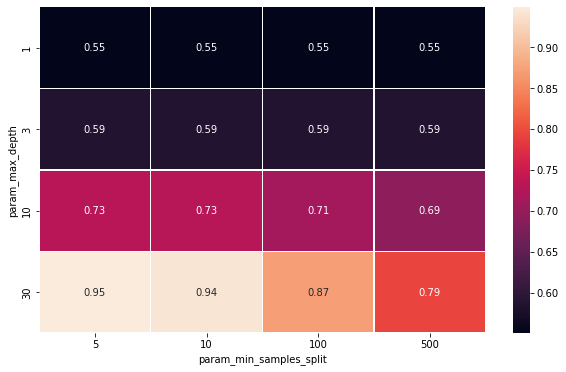

In [ ]:
import pandas as pd
pvt = pd.pivot_table(pd.DataFrame(clf.cv_results_),
    values='mean_train_score', index='param_max_depth', columns='param_min_samples_split') #https://stackoverflow.com/questions/48791709/how-to-plot-a-heat-map-on-pivot-table-after-grid-search
plt.figure(figsize=(10,6))
ax=sns.heatmap(pvt,annot=True,linewidths=.5)

**Test data**

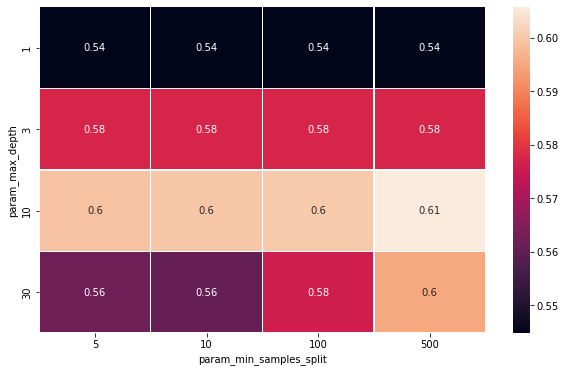

In [ ]:
import pandas as pd
pvt = pd.pivot_table(pd.DataFrame(clf.cv_results_),
    values='mean_test_score', index='param_max_depth', columns='param_min_samples_split') #https://stackoverflow.com/questions/48791709/how-to-plot-a-heat-map-on-pivot-table-after-grid-search
plt.figure(figsize=(10,6))
ax=sns.heatmap(pvt,annot=True,linewidths=.5)

In [ ]:
!pip install plotly

In [ ]:
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
max_depth = [1, 3, 10, 30]
min_samples_split = [5, 10, 100, 500]
x1 = max_depth
y1 = min_samples_split 
z1 = train_auc
z2 = cv_auc

In [ ]:
# https://plot.ly/python/3d-axes/
trace1 = go.Scatter3d(x=x1,y=y1,z=z1, name = 'train')
trace2 = go.Scatter3d(x=x1,y=y1,z=z2, name = 'Cross validation')
data = [trace1, trace2]

layout = go.Layout(scene = dict(
        xaxis = dict(title='max_depth'),
        yaxis = dict(title= 'min_samples_split'),
        zaxis = dict(title='AUC'),))

fig = go.Figure(data=data, layout=layout)
offline.iplot(fig, filename='3d-scatter-colorscale')
fig.show()
plt.show()

**Plot ROC-AUC curve(using predict proba method)**

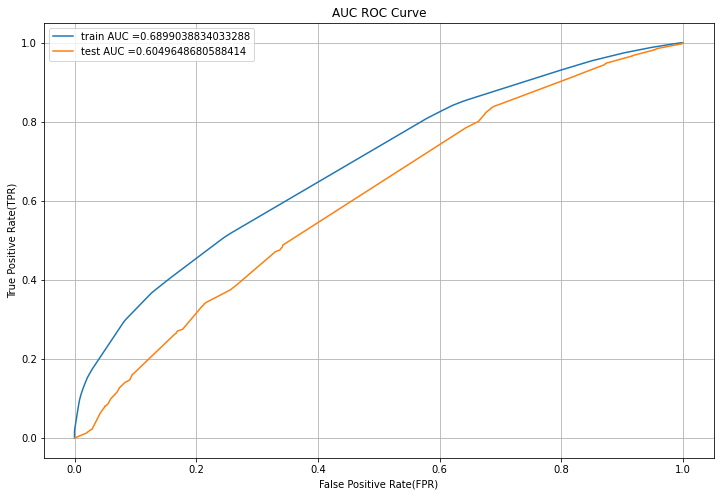

In [ ]:
model_set1 = DecisionTreeClassifier(class_weight='balanced',max_depth =clf.best_params_['max_depth'], min_samples_split = clf.best_params_['min_samples_split'])
model_set1.fit(X_tr_set_1, y_train)
#converting train and test output into probability
y_train_prob =clf.predict_proba(X_tr_set_1)[:,1]     
y_test_prob = clf.predict_proba(X_te_set_1)[:,1]
#https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_curve.html
train_fpr, train_tpr, tr_thresholds = roc_curve(y_train, y_train_prob)
test_fpr, test_tpr, te_thresholds = roc_curve(y_test, y_test_prob)

plt.figure(figsize=(12,8))
plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.xlabel("False Positive Rate(FPR)")
plt.ylabel("True Positive Rate(TPR)")
plt.title("AUC ROC Curve")
plt.grid()
plt.show()


**Plot confusion matrix based on best threshold value**

In [ ]:
# we are writing our own function for predict, with defined thresould
# we will pick a threshold that will give the least fpr
def find_best_threshold(threshould, fpr, tpr):
    t = threshould[np.argmax(tpr*(1-fpr))]
    # (tpr*(1-fpr)) will be maximum if your fpr is very low and tpr is very high
    print("the maximum value of tpr*(1-fpr)", max(tpr*(1-fpr)), "for threshold", np.round(t,3))
    return t

def predict_with_best_t(proba, threshould):
    predictions = []
    for i in proba:
        if i>=threshould:
            predictions.append(1)
        else:
            predictions.append(0)
    return predictions

**Train data**

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt  

the maximum value of tpr*(1-fpr) 0.3853149912442853 for threshold 0.49
Train confusion matrix
[[ 3982  1383]
 [13529 14606]]


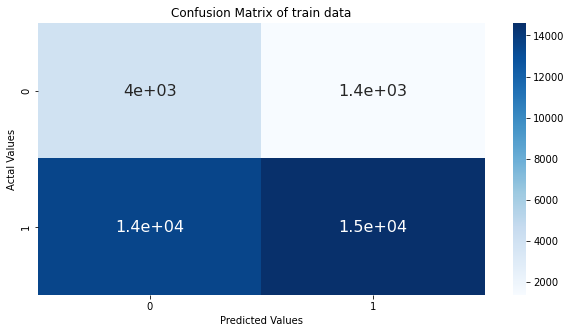

In [ ]:
print("="*100)
from sklearn.metrics import confusion_matrix
best_t = find_best_threshold(tr_thresholds, train_fpr, train_tpr)
print("Train confusion matrix")
print(confusion_matrix(y_train, predict_with_best_t(y_train_prob, best_t)))
print("="*100)
#https://stackoverflow.com/questions/35572000/how-can-i-plot-a-confusion-matrix
#https://stackoverflow.com/questions/61748441/
cm= confusion_matrix(y_train, predict_with_best_t(y_train_prob, best_t))
cm_df = pd.DataFrame(cm,index = [0, 1], columns = [0, 1])
plt.figure(figsize=(10,5))
sns.heatmap(cm_df, annot=True,cmap='Blues',annot_kws={"size": 16})
plt.title('Confusion Matrix of train data')
plt.ylabel('Actal Values')
plt.xlabel('Predicted Values')
plt.show()

**Test data**

the maximum value of tpr*(1-fpr) 0.3853149912442853 for threshold 0.49
Test confusion matrix
[[1738  904]
 [7096 6762]]


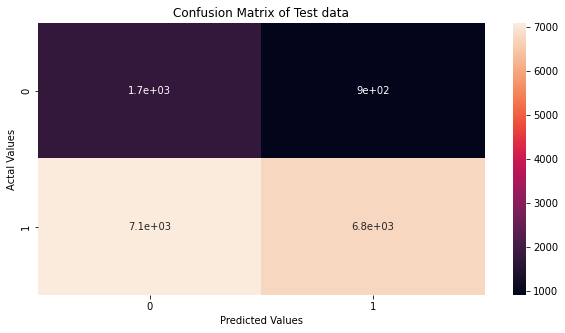

In [ ]:
print("="*100)
from sklearn.metrics import confusion_matrix
best_t = find_best_threshold(tr_thresholds, train_fpr, train_tpr)
print("Test confusion matrix")
print(confusion_matrix(y_test, predict_with_best_t(y_test_prob, best_t)))
print("="*100)
#https://stackoverflow.com/questions/35572000/how-can-i-plot-a-confusion-matrix
#https://stackoverflow.com/questions/61748441/
cm=confusion_matrix(y_test, predict_with_best_t(y_test_prob, best_t))
cm_df = pd.DataFrame(cm,index = [0, 1], columns = [0, 1])
plt.figure(figsize=(10,5))
sns.heatmap(cm_df, annot=True)
plt.title('Confusion Matrix of Test data')
plt.ylabel('Actal Values')
plt.xlabel('Predicted Values')
plt.show()

**Find all the false positive data points and plot wordcloud of essay text and pdf of teacher_number_of_previously_posted_projects.**

In [ ]:
predict=predict_with_best_t(y_test_prob,best_t)


In [ ]:
fpi = []
for i in range(len(y_test)):
  if (y_test[i]==0) & (predict[i] == 1):
     fpi.append(i)



In [ ]:
import pandas as pd
cols = X_test.columns
# MAKING THE FALSE POSITIVE DATAFRAME
X_test_false_Positive = pd.DataFrame(columns=cols) 
X_test_false_Positive=X_test.iloc[fpi]    
print(X_test_false_Positive.shape)  


(904, 12)



**wordcloud Of Essay Text For False Positive Dataset**

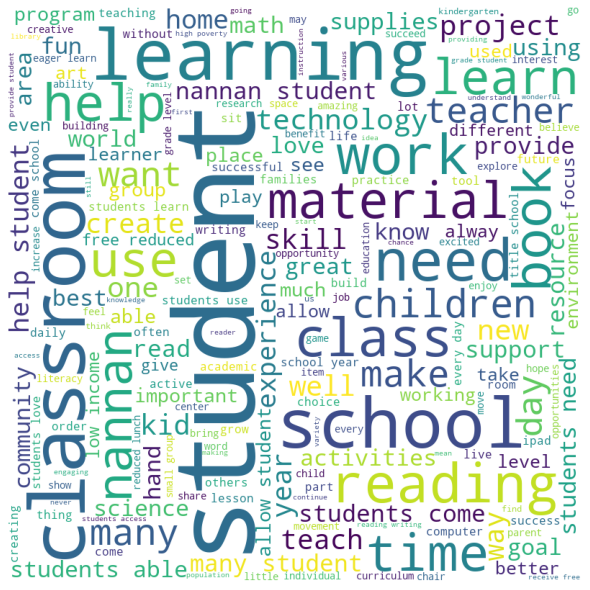

In [ ]:
#https://www.geeksforgeeks.org/generating-word-cloud-python/
from wordcloud import WordCloud, STOPWORDS
# Python program to generate WordCloud
comment_words = ''
stopwords = set(STOPWORDS)

# iterate through the csv file
for val in X_test_false_Positive['essay']:
	
	# typecaste each val to string
	val = str(val)

	# split the value
	tokens = val.split()
	
	# Converts each token into lowercase
	for i in range(len(tokens)):
		tokens[i] = tokens[i].lower()
	
	comment_words += " ".join(tokens)+" "

wordcloud = WordCloud(width = 800, height = 800,
				background_color ='white',
				stopwords = stopwords,
				min_font_size = 10).generate(comment_words)

# plot the WordCloud image					
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)

plt.show()


**Box Plot With The Price Of These False Positive Data Points**

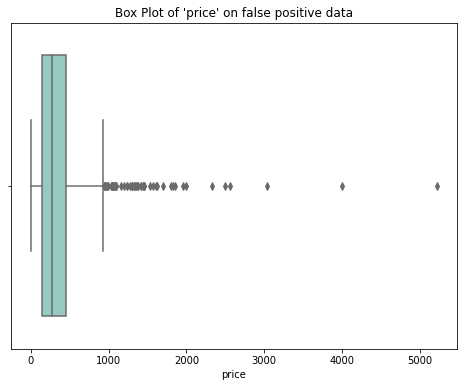

In [ ]:
plt.figure(figsize=(8,6))
ax = sns.boxplot('price',data=X_test_false_Positive,palette="Set3")
ax.set_title("Box Plot of 'price' on false positive data")
ax

**Pdf Plot With The teacher_number_of_previously_posted_projects Of These False Positive Data Points**

Text(0.5, 0, 'teacher_number_of_previously_posted_projects')

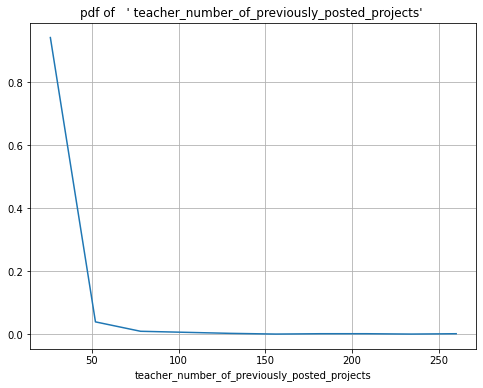

In [ ]:
plt.figure(figsize=(8,6))
plt.grid()
counts, bin_edges = np.histogram(X_test_false_Positive['teacher_number_of_previously_posted_projects'], bins=10, 
                                 density = True)
pdf = counts/(sum(counts))
cdf = np.cumsum(pdf)
plt.plot(bin_edges[1:],pdf,label= "PDF,X_test_false_Positive");
plt.title("pdf of   ' teacher_number_of_previously_posted_projects' ")
plt.xlabel('teacher_number_of_previously_posted_projects')

        DECISION TREE USING GRID SEARCH CROSS VALIDATION (SET - 2)

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier
DT_model = DecisionTreeClassifier(class_weight='balanced')
tree_parameters = { 'max_depth': [1, 3, 10, 30],'min_samples_split' : [5, 10, 100, 500]}
clf = GridSearchCV(DT_model, tree_parameters, cv=5, scoring='roc_auc',return_train_score=True,n_jobs=-1)
clf.fit(X_tr_set_2, y_train)
train_auc= clf.cv_results_['mean_train_score']
train_auc_std= clf.cv_results_['std_train_score']
cv_auc = clf.cv_results_['mean_test_score'] 
cv_auc_std= clf.cv_results_['std_test_score']

In [ ]:
print('Best score: ',clf.best_score_)
print('Best Hyper parameters: ',clf.best_params_)

Best score:  0.5957633868525322
Best Hyper parameters:  {'max_depth': 10, 'min_samples_split': 500}


**Plotting Hyperparameter v/s Auc**

**Train data**

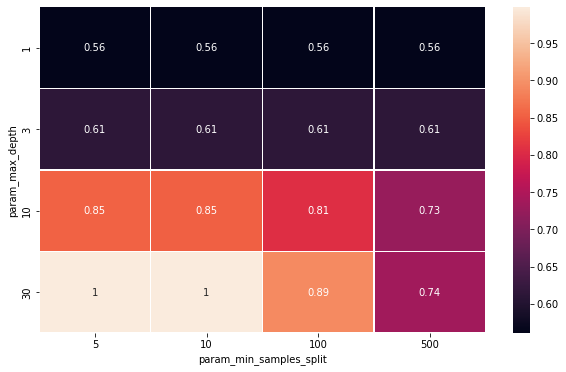

In [ ]:
import pandas as pd
pvt = pd.pivot_table(pd.DataFrame(clf.cv_results_),
    values='mean_train_score', index='param_max_depth', columns='param_min_samples_split') #https://stackoverflow.com/questions/48791709/how-to-plot-a-heat-map-on-pivot-table-after-grid-search
plt.figure(figsize=(10,6))
ax=sns.heatmap(pvt,annot=True,linewidths=.5)

**Test data**

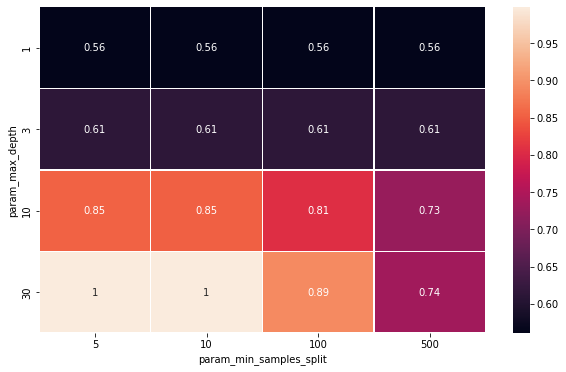

In [ ]:
import pandas as pd
pvt = pd.pivot_table(pd.DataFrame(clf.cv_results_),
    values='mean_train_score', index='param_max_depth', columns='param_min_samples_split') #https://stackoverflow.com/questions/48791709/how-to-plot-a-heat-map-on-pivot-table-after-grid-search
plt.figure(figsize=(10,6))
ax=sns.heatmap(pvt,annot=True,linewidths=.5)

In [ ]:
max_depth = [1, 3, 10, 30]
min_samples_split = [5, 10, 100, 500]
x1 = max_depth
y1 = min_samples_split 
z1 = train_auc
z2 = cv_auc

In [ ]:
# https://plot.ly/python/3d-axes/
trace1 = go.Scatter3d(x=x1,y=y1,z=z1, name = 'train')
trace2 = go.Scatter3d(x=x1,y=y1,z=z2, name = 'Cross validation')
data = [trace1, trace2]

layout = go.Layout(scene = dict(
        xaxis = dict(title='max_depth'),
        yaxis = dict(title= 'min_samples_split'),
        zaxis = dict(title='AUC'),))

fig = go.Figure(data=data, layout=layout)
offline.iplot(fig, filename='3d-scatter-colorscale')
fig.show()
plt.show()

**Plot ROC-AUC curve(using predict proba method)**

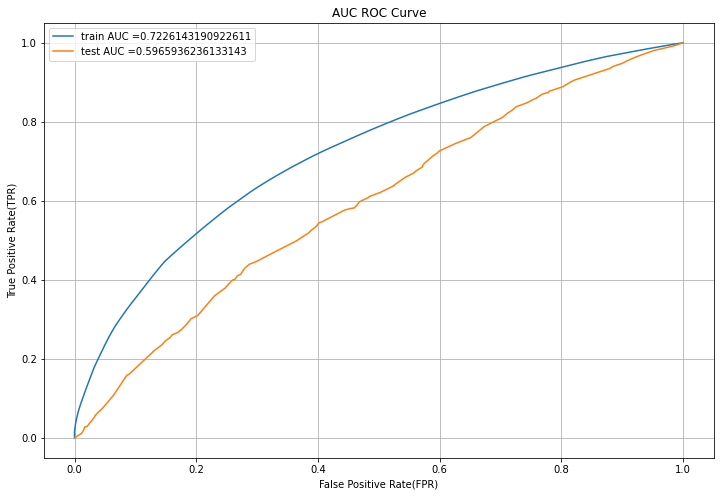

In [ ]:
model_set2 = DecisionTreeClassifier(class_weight='balanced',max_depth =clf.best_params_['max_depth'], min_samples_split = clf.best_params_['min_samples_split'])
model_set2.fit(X_tr_set_2, y_train)
#converting train and test output into probability
y_train_prob =clf.predict_proba(X_tr_set_2)[:,1]     
y_test_prob = clf.predict_proba(X_te_set_2)[:,1]
#https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_curve.html
train_fpr, train_tpr, tr_thresholds = roc_curve(y_train, y_train_prob)
test_fpr, test_tpr, te_thresholds = roc_curve(y_test, y_test_prob)

plt.figure(figsize=(12,8))
plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.xlabel("False Positive Rate(FPR)")
plt.ylabel("True Positive Rate(TPR)")
plt.title("AUC ROC Curve")
plt.grid()
plt.show()

**Plot confusion matrix based on best threshold value**

In [ ]:
# we are writing our own function for predict, with defined thresould
# we will pick a threshold that will give the least fpr
def find_best_threshold(threshould, fpr, tpr):
    t = threshould[np.argmax(tpr*(1-fpr))]
    # (tpr*(1-fpr)) will be maximum if your fpr is very low and tpr is very high
    print("the maximum value of tpr*(1-fpr)", max(tpr*(1-fpr)), "for threshold", np.round(t,3))
    return t

def predict_with_best_t(proba, threshould):
    predictions = []
    for i in proba:
        if i>=threshould:
            predictions.append(1)
        else:
            predictions.append(0)
    return predictions

**Train data**

the maximum value of tpr*(1-fpr) 0.44394320354316186 for threshold 0.486
Train confusion matrix
[[ 3689  1676]
 [ 9970 18165]]


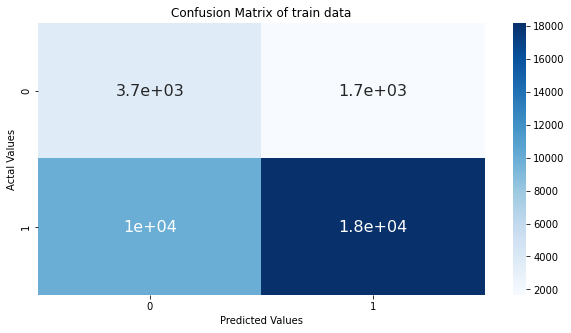

In [ ]:
print("="*100)
from sklearn.metrics import confusion_matrix
best_t = find_best_threshold(tr_thresholds, train_fpr, train_tpr)
print("Train confusion matrix")
print(confusion_matrix(y_train, predict_with_best_t(y_train_prob, best_t)))
print("="*100)
#https://stackoverflow.com/questions/35572000/how-can-i-plot-a-confusion-matrix
#https://stackoverflow.com/questions/61748441/
cm= confusion_matrix(y_train, predict_with_best_t(y_train_prob, best_t))
cm_df = pd.DataFrame(cm,index = [0, 1], columns = [0, 1])
plt.figure(figsize=(10,5))
sns.heatmap(cm_df, annot=True,cmap='Blues',annot_kws={"size": 16})
plt.title('Confusion Matrix of train data')
plt.ylabel('Actal Values')
plt.xlabel('Predicted Values')
plt.show()

**Test data**

the maximum value of tpr*(1-fpr) 0.44394320354316186 for threshold 0.486
Test confusion matrix
[[1406 1236]
 [5579 8279]]


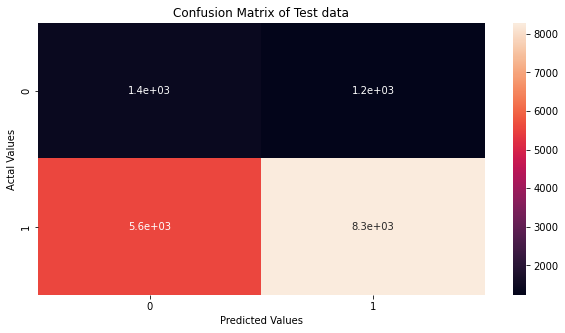

In [ ]:
print("="*100)
from sklearn.metrics import confusion_matrix
best_t = find_best_threshold(tr_thresholds, train_fpr, train_tpr)
print("Test confusion matrix")
print(confusion_matrix(y_test, predict_with_best_t(y_test_prob, best_t)))
print("="*100)
#https://stackoverflow.com/questions/35572000/how-can-i-plot-a-confusion-matrix
#https://stackoverflow.com/questions/61748441/
cm=confusion_matrix(y_test, predict_with_best_t(y_test_prob, best_t))
cm_df = pd.DataFrame(cm,index = [0, 1], columns = [0, 1])
plt.figure(figsize=(10,5))
sns.heatmap(cm_df, annot=True)
plt.title('Confusion Matrix of Test data')
plt.ylabel('Actal Values')
plt.xlabel('Predicted Values')
plt.show()

**Find all the false positive data points and plot wordcloud of essay text and pdf of teacher_number_of_previously_posted_projects.**

In [ ]:
predict=predict_with_best_t(y_test_prob,best_t)
fpi = []
for i in range(len(y_test)):
  if (y_test[i]==0) & (predict[i] == 1):
     fpi.append(i)


In [ ]:
import pandas as pd
cols = X_test.columns

X_test_false_Positive = pd.DataFrame(columns=cols) # MAKING THE FALSE POSITIVE DATAFRAME
X_test_false_Positive=X_test.iloc[fpi]    
print(X_test_false_Positive.shape)  

(1236, 12)


**wordcloud Of Essay Text For False Positive Dataset**

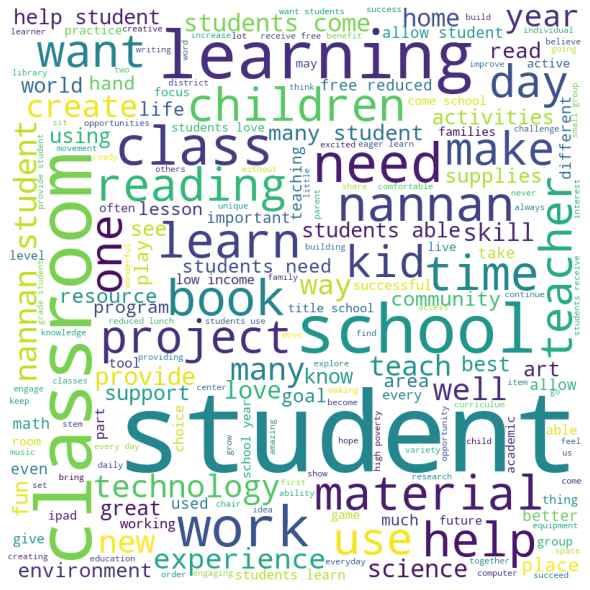

In [ ]:
#https://www.geeksforgeeks.org/generating-word-cloud-python/
from wordcloud import WordCloud, STOPWORDS
# Python program to generate WordCloud
comment_words = ''
stopwords = set(STOPWORDS)

# iterate through the csv file
for val in X_test_false_Positive['essay']:
	
	# typecaste each val to string
	val = str(val)

	# split the value
	tokens = val.split()
	
	# Converts each token into lowercase
	for i in range(len(tokens)):
		tokens[i] = tokens[i].lower()
	
	comment_words += " ".join(tokens)+" "

wordcloud = WordCloud(width = 800, height = 800,
				background_color ='white',
				stopwords = stopwords,
				min_font_size = 10).generate(comment_words)

# plot the WordCloud image					
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)

plt.show()


**Box Plot With The Price Of These False Positive Data Points**

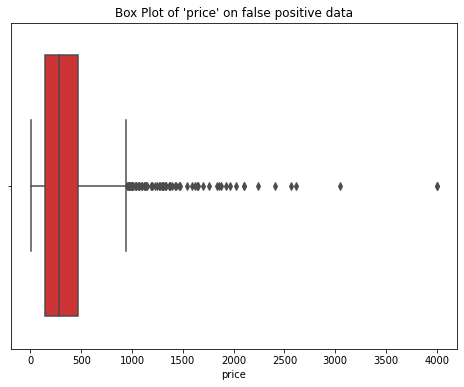

In [ ]:
plt.figure(figsize=(8,6))
ax = sns.boxplot('price',data=X_test_false_Positive,palette="Set1")
ax.set_title("Box Plot of 'price' on false positive data")
ax

**Pdf Plot With The teacher_number_of_previously_posted_projects Of These False Positive Data Points**

Text(0.5, 0, 'teacher_number_of_previously_posted_projects')

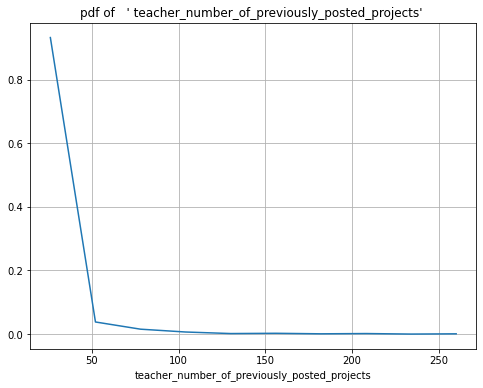

In [ ]:
plt.figure(figsize=(8,6))
plt.grid()
counts, bin_edges = np.histogram(X_test_false_Positive['teacher_number_of_previously_posted_projects'], bins=10, 
                                 density = True)
pdf = counts/(sum(counts))
cdf = np.cumsum(pdf)
plt.plot(bin_edges[1:],pdf,label= "PDF,X_test_false_Positive");
plt.title("pdf of   ' teacher_number_of_previously_posted_projects' ")
plt.xlabel('teacher_number_of_previously_posted_projects')

In [ ]:
# write your code in following steps for task 1
# 1. calculate sentiment scores for the essay feature 
# 2. Split your data.
# 3. perform tfidf vectorization of text data.
# 4. perform tfidf w2v vectorization of text data.
# 5. perform encoding of categorical features.
# 6. perform encoding of numerical features
# 7. For task 1 set 1 stack up all the features
# 8. For task 1 set 2 stack up all the features (for stacking dense features you can use np.stack)
# 9. Perform hyperparameter tuning and plot either heatmap or 3d plot.
# 10. Find the best parameters and fit the model. Plot ROC-AUC curve(using predict proba method)
# 11. Plot confusion matrix based on best threshold value
# 12. Find all the false positive data points and plot wordcloud of essay text and pdf of teacher_number_of_previously_posted_projects.
# 13. Write your observations about the wordcloud and pdf.

In [ ]:
# please write all the code with proper documentation, and proper titles for each subsection
# go through documentations and blogs before you start coding
# first figure out what to do, and then think about how to do.
# reading and understanding error messages will be very much helpfull in debugging your code
# when you plot any graph make sure you use 
    # a. Title, that describes your plot, this will be very helpful to the reader
    # b. Legends if needed
    # c. X-axis label
    # d. Y-axis label

# <font color='red'> <b>Task - 2</b></font>

In [ ]:
# 1. write your code in following steps for task 2
# 2. select all non zero features
# 3. Update your dataset i.e. X_train,X_test and X_cv so that it contains all rows and only non zero features
# 4. perform hyperparameter tuning and plot either heatmap or 3d plot.
# 5. Fit the best model. Plot ROC AUC curve and confusion matrix similar to model 1.


In [ ]:
# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039
from scipy.sparse import hstack
X_tr_set_1 = hstack((X_train_essay_tfidf, X_train_state_ohe, X_train_teacher_ohe, X_train_grade_ohe, X_train_cate_ohe, X_train_cleansub_ohe, X_train_price_norm, X_train_preproj_norm,X_train_neg_norm,X_train_pos_norm,X_train_neu_norm,X_train_compound_norm)).tocsr()
X_te_set_1 = hstack((X_test_essay_tfidf, X_test_state_ohe, X_test_teacher_ohe, X_test_grade_ohe,X_test_cate_ohe,X_test_cleansub_ohe, X_test_price_norm, X_test_preproj_norm,X_test_neg_norm,X_test_pos_norm,X_test_neu_norm,X_test_compound_norm)).tocsr()
print("Final Data matrix ")
print(X_tr_set_1.shape, y_train.shape)
print(X_te_set_1.shape, y_test.shape)

Final Data matrix 
(33500, 5105) (33500,)
(16500, 5105) (16500,)


**select all non zero features**

In [ ]:
clf= DecisionTreeClassifier(class_weight='balanced',max_depth=None,min_samples_split=500)
clf.fit(X_tr_set_1,y_train)
feature =clf.feature_importances_
print(len(feature))

5105


In [ ]:
non_zero_features = []
for i in range(len(feature)):
  #filtering through if codnition
  if feature[i] > 0:
      non_zero_features.append(i)

print("No'r of non_zero_features =" ,len(non_zero_features))

No'r of non_zero_features = 439


In [ ]:
X_train_fea= X_tr_set_1[:,non_zero_features]
X_test_fea = X_te_set_1[:,non_zero_features] 

In [ ]:
print(X_train_fea.shape)
print(X_test_fea.shape)

(33500, 439)
(16500, 439)


        DECISION TREE USING GRID SEARCH CROSS VALIDATION (SET - 1)(non_zero_feature)

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier
DT_model = DecisionTreeClassifier(class_weight='balanced')
tree_parameters = { 'max_depth': [1, 3, 10, 30],'min_samples_split' : [5, 10, 100, 500]}
clf = GridSearchCV(DT_model, tree_parameters, cv=5, scoring='roc_auc',return_train_score=True,n_jobs=-1)
clf.fit(X_train_fea, y_train)
train_auc= clf.cv_results_['mean_train_score']
train_auc_std= clf.cv_results_['std_train_score']
cv_auc = clf.cv_results_['mean_test_score'] 
cv_auc_std= clf.cv_results_['std_test_score']


In [ ]:
print('Best score: ',clf.best_score_)
print('Best Hyper parameters: ',clf.best_params_)

Best score:  0.618434236740678
Best Hyper parameters:  {'max_depth': 30, 'min_samples_split': 500}


**Plotting Hyperparameter v/s Auc**

**Train data**

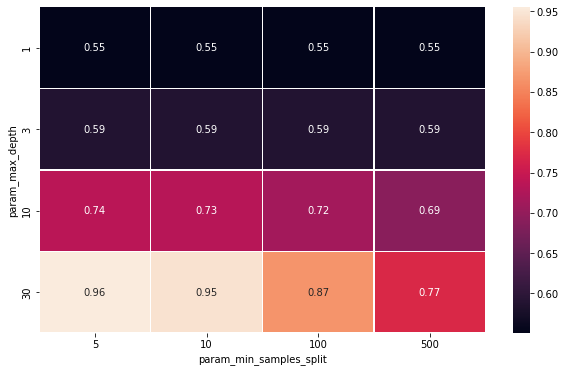

In [ ]:
import pandas as pd
pvt = pd.pivot_table(pd.DataFrame(clf.cv_results_),
    values='mean_train_score', index='param_max_depth', columns='param_min_samples_split') #https://stackoverflow.com/questions/48791709/how-to-plot-a-heat-map-on-pivot-table-after-grid-search
plt.figure(figsize=(10,6))
ax=sns.heatmap(pvt,annot=True,linewidths=.5)

**Test data**

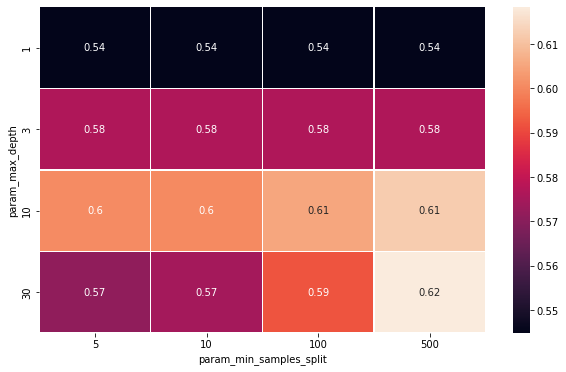

In [ ]:
import pandas as pd
pvt = pd.pivot_table(pd.DataFrame(clf.cv_results_),
    values='mean_test_score', index='param_max_depth', columns='param_min_samples_split') #https://stackoverflow.com/questions/48791709/how-to-plot-a-heat-map-on-pivot-table-after-grid-search
plt.figure(figsize=(10,6))
ax=sns.heatmap(pvt,annot=True,linewidths=.5)

In [ ]:
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
max_depth = [1, 3, 10, 30]
min_samples_split = [5, 10, 100, 500]
x1 = max_depth
y1 = min_samples_split 
z1 = train_auc
z2 = cv_auc

In [ ]:
# https://plot.ly/python/3d-axes/
trace1 = go.Scatter3d(x=x1,y=y1,z=z1, name = 'train')
trace2 = go.Scatter3d(x=x1,y=y1,z=z2, name = 'Cross validation')
data = [trace1, trace2]

layout = go.Layout(scene = dict(
        xaxis = dict(title='max_depth'),
        yaxis = dict(title= 'min_samples_split'),
        zaxis = dict(title='AUC'),))

fig = go.Figure(data=data, layout=layout)
offline.iplot(fig, filename='3d-scatter-colorscale')
fig.show()
plt.show()

**Plot ROC-AUC curve(using predict proba method)**

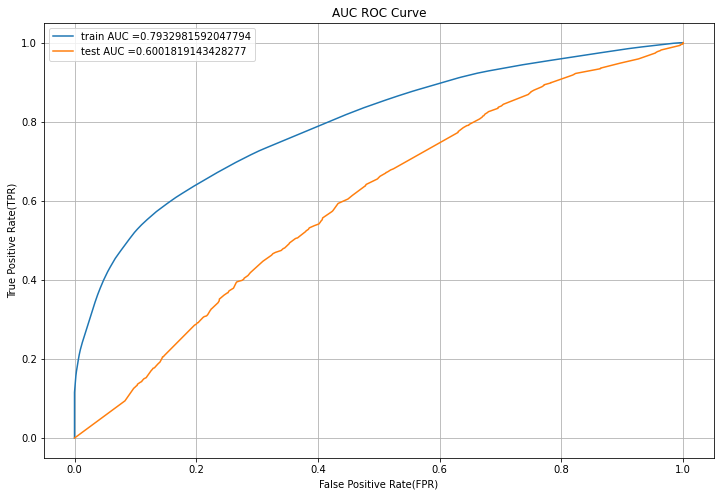

In [ ]:
model_set1_fea = DecisionTreeClassifier(class_weight='balanced',max_depth =clf.best_params_['max_depth'], min_samples_split = clf.best_params_['min_samples_split'])
model_set1_fea.fit(X_train_fea, y_train)
#converting train and test output into probability
y_train_prob =clf.predict_proba(X_train_fea)[:,1]     
y_test_prob = clf.predict_proba(X_test_fea)[:,1]
#https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_curve.html
train_fpr, train_tpr, tr_thresholds = roc_curve(y_train, y_train_prob)
test_fpr, test_tpr, te_thresholds = roc_curve(y_test, y_test_prob)

plt.figure(figsize=(12,8))
plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.xlabel("False Positive Rate(FPR)")
plt.ylabel("True Positive Rate(TPR)")
plt.title("AUC ROC Curve")
plt.grid()
plt.show()


**Plot confusion matrix based on best threshold value**

In [ ]:
# we are writing our own function for predict, with defined thresould
# we will pick a threshold that will give the least fpr
def find_best_threshold(threshould, fpr, tpr):
    t = threshould[np.argmax(tpr*(1-fpr))]
    # (tpr*(1-fpr)) will be maximum if your fpr is very low and tpr is very high
    print("the maximum value of tpr*(1-fpr)", max(tpr*(1-fpr)), "for threshold", np.round(t,3))
    return t

def predict_with_best_t(proba, threshould):
    predictions = []
    for i in proba:
        if i>=threshould:
            predictions.append(1)
        else:
            predictions.append(0)
    return predictions

**Train data**

the maximum value of tpr*(1-fpr) 0.5140542826152233 for threshold 0.467
Train confusion matrix
[[ 4107  1258]
 [ 9242 18893]]


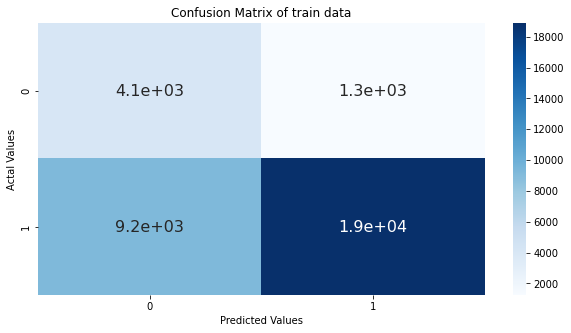

In [ ]:
print("="*100)
from sklearn.metrics import confusion_matrix
best_t = find_best_threshold(tr_thresholds, train_fpr, train_tpr)
print("Train confusion matrix")
print(confusion_matrix(y_train, predict_with_best_t(y_train_prob, best_t)))
print("="*100)
#https://stackoverflow.com/questions/35572000/how-can-i-plot-a-confusion-matrix
#https://stackoverflow.com/questions/61748441/
cm= confusion_matrix(y_train, predict_with_best_t(y_train_prob, best_t))
cm_df = pd.DataFrame(cm,index = [0, 1], columns = [0, 1])
plt.figure(figsize=(10,5))
sns.heatmap(cm_df, annot=True,cmap='Blues',annot_kws={"size": 16})
plt.title('Confusion Matrix of train data')
plt.ylabel('Actal Values')
plt.xlabel('Predicted Values')
plt.show()

**Test data**

the maximum value of tpr*(1-fpr) 0.5140542826152233 for threshold 0.467
Test confusion matrix
[[1436 1206]
 [5353 8505]]


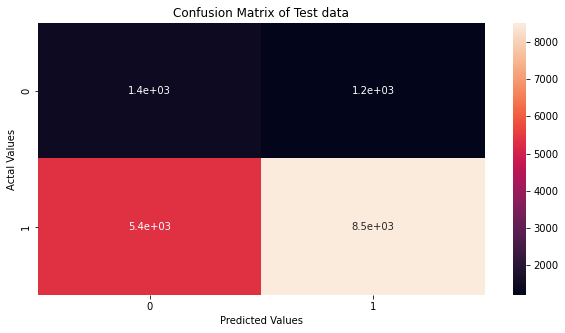

In [ ]:
print("="*100)
from sklearn.metrics import confusion_matrix
best_t = find_best_threshold(tr_thresholds, train_fpr, train_tpr)
print("Test confusion matrix")
print(confusion_matrix(y_test, predict_with_best_t(y_test_prob, best_t)))
print("="*100)
#https://stackoverflow.com/questions/35572000/how-can-i-plot-a-confusion-matrix
#https://stackoverflow.com/questions/61748441/
cm=confusion_matrix(y_test, predict_with_best_t(y_test_prob, best_t))
cm_df = pd.DataFrame(cm,index = [0, 1], columns = [0, 1])
plt.figure(figsize=(10,5))
sns.heatmap(cm_df, annot=True)
plt.title('Confusion Matrix of Test data')
plt.ylabel('Actal Values')
plt.xlabel('Predicted Values')
plt.show()


**Getting All the False Positive Data Points**

In [ ]:
predict=predict_with_best_t(y_test_prob,best_t)
fpi = []
for i in range(len(y_test)):
  if (y_test[i]==0) & (predict[i] == 1):
     fpi.append(i)

In [ ]:
import pandas as pd
cols = X_test.columns

X_test_false_Positive = pd.DataFrame(columns=cols) # MAKING THE FALSE POSITIVE DATAFRAME
X_test_false_Positive=X_test.iloc[fpi]    
print(X_test_false_Positive.shape)  

(1206, 12)


**wordcloud Of Essay Text For False Positive Dataset**

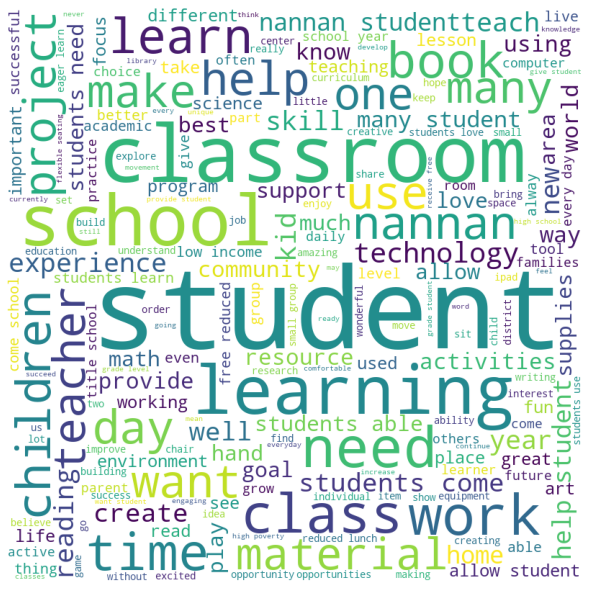

In [ ]:
#https://www.geeksforgeeks.org/generating-word-cloud-python/
from wordcloud import WordCloud, STOPWORDS
# Python program to generate WordCloud
comment_words = ''
stopwords = set(STOPWORDS)

# iterate through the csv file
for val in X_test_false_Positive['essay']:
	
	# typecaste each val to string
	val = str(val)

	# split the value
	tokens = val.split()
	
	# Converts each token into lowercase
	for i in range(len(tokens)):
		tokens[i] = tokens[i].lower()
	
	comment_words += " ".join(tokens)+" "

wordcloud = WordCloud(width = 800, height = 800,
				background_color ='white',
				stopwords = stopwords,
				min_font_size = 10).generate(comment_words)

# plot the WordCloud image					
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)

plt.show()

**Box Plot With The Price Of These False Positive Data Points**

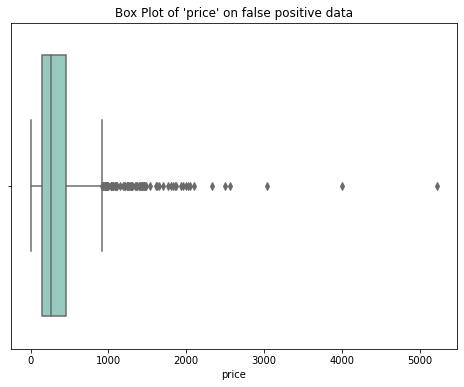

In [ ]:
plt.figure(figsize=(8,6))
ax = sns.boxplot('price',data=X_test_false_Positive,palette="Set3")
ax.set_title("Box Plot of 'price' on false positive data")
ax

**Pdf Plot With The teacher_number_of_previously_posted_projects Of These False Positive Data Points**

Text(0.5, 0, 'teacher_number_of_previously_posted_projects')

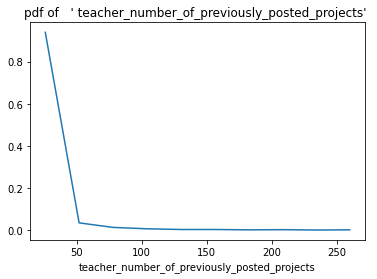

In [ ]:
counts, bin_edges = np.histogram(X_test_false_Positive['teacher_number_of_previously_posted_projects'], bins=10, 
                                 density = True)
pdf = counts/(sum(counts))
cdf = np.cumsum(pdf)
plt.plot(bin_edges[1:],pdf,label= "PDF,X_test_false_Positive");
plt.title("pdf of   ' teacher_number_of_previously_posted_projects' ")
plt.xlabel('teacher_number_of_previously_posted_projects')

**Final Summary:**

In [ ]:
#https://pypi.org/project/prettytable/
from prettytable import PrettyTable
table=PrettyTable()
table.field_names = ["Feature_vectorizer", "Model","Hyper Parameter", "Test-AUC"] # # http://zetcode.com/python/prettytable/
table.add_row(["TFIDF", "DECSION TREE","max_depth =10  min_samples_split=500",0.6049])
table.add_row(["TTFIDF W2V", "DECSION TREE","max_depth =10  min_samples_split=500",0.596])
table.add_row([" TFIDF NON ZERO FEATURE IMPORTANCE", "DECSION TREE","max_depth =30  min_samples_split=500",0.600 ])
print(table)

+------------------------------------+--------------+--------------------------------------+----------+
|         Feature_vectorizer         |    Model     |           Hyper Parameter            | Test-AUC |
+------------------------------------+--------------+--------------------------------------+----------+
|               TFIDF                | DECSION TREE | max_depth =10  min_samples_split=500 |  0.6049  |
|             TTFIDF W2V             | DECSION TREE | max_depth =10  min_samples_split=500 |  0.596   |
|  TFIDF NON ZERO FEATURE IMPORTANCE | DECSION TREE | max_depth =30  min_samples_split=500 |   0.6    |
+------------------------------------+--------------+--------------------------------------+----------+
